In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
# Download MT-YOLOv6 repository and install requirements
!git clone https://github.com/meituan/YOLOv6
%cd YOLOv6
!pip install -r requirements.txt

!pip uninstall -y wandb

Cloning into 'YOLOv6'...
remote: Enumerating objects: 3838, done.
remote: Total 3838 (delta 0), reused 0 (delta 0), pack-reused 3838 (from 1)
Receiving objects: 100% (3838/3838), 43.99 MiB | 40.00 MiB/s, done.
Resolving deltas: 100% (2298/2298), done.
/kaggle/working/YOLOv6
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 36.7 MB/s eta 0:00:00
Found existing installation: wandb 0.19.1
Uninstalling wandb-0.19.1:
  Successfully uninstalled wandb-0.19.1


In [3]:
cp -r /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5 /kaggle/working/

In [4]:
coco128 = """# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /kaggle/working/JU_yolov5  # dataset root dir
train: /kaggle/working/JU_yolov5/train  # train images 128 images
val: /kaggle/working/JU_yolov5/valid  # val images 128 images
test: /kaggle/working/JU_yolov5/valid # test images (optional)

# Classes
nc: 14  # number of classes
names: ['trak', 'cyclist', 'bike', 'tempo', 'car', 'zeep', 'toto', 'e-rickshaw', 'auto-rickshaw', 'bus', 'van', 'cycle-rickshaw', 'person', 'taxi'] # class names
"""

with open('/kaggle/working/JU_yolov5/data.yaml', 'w') as f:
  f.write(coco128)

In [5]:
%cd /kaggle/working/YOLOv6
!python tools/train.py --batch-size 16 \
                       --conf-file '/kaggle/working/YOLOv6/configs/yolov6s_finetune.py' \
                       --data-path "/kaggle/working/JU_yolov5/data.yaml" \
                       --device 0 \
                       --epochs 30

/kaggle/working/YOLOv6
2025-03-29 15:18:27.212304: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-29 15:18:27.396281: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-29 15:18:27.444385: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/kaggle/working/YOLOv6/yolov6/utils/checkpoint.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/

In [6]:
!python tools/eval.py --data '/kaggle/working/JU_yolov5/data.yaml' \
                      --weights '/kaggle/working/YOLOv6/runs/train/exp/weights/best_ckpt.pt' \
                      --task val \
                      --device 0 \
                      --batch-size 16 \
                      # --do_coco_metric 'False' \
                      --do_pr_metric 'True' \
                      --verbose 'True' \
                      --reproduce_640_eval 'False'

/kaggle/working/YOLOv6/yolov6/utils/checkpoint.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(weights, map_location=map_location)  # load
800 label(s

In [7]:
mkdir -p /kaggle/working/inference_results/images/labels

In [8]:
# infer on all images in our /test directory
!python tools/infer.py --weights '/kaggle/working/YOLOv6/runs/train/exp/weights/best_ckpt.pt' \
                       --source '/kaggle/working/JU_yolov5/valid/images' \
                       --yaml '/kaggle/working/JU_yolov5/data.yaml' \
                       --img-size 640 640 \
                       --conf-thres 0.4 \
                       --iou-thres 0.45 \
                       --max-det 1000 \
                       --device 0 \
                       --save-txt \
                       --save-dir '/kaggle/working/inference_results'

/kaggle/working/YOLOv6/yolov6/utils/checkpoint.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(weights, map_location=map_location)  # load
100%|██████

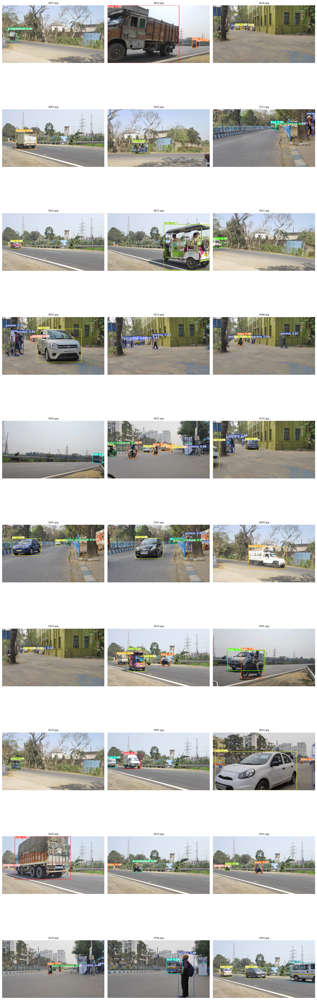

In [9]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path
#from yolov6 import detect  # Import detect.py as a module

def display_random_images_from_folder(folder_path, num_images=30):
    """
    Finds and displays a random selection of .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List all valid images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Randomly select images (up to num_images)
    num_images = min(num_images, len(image_files))  # In case there are fewer than 30 images
    selected_images = random.sample(image_files, num_images)

    # Grid setup
    grid_rows = 10  # Adjust based on num_images
    grid_cols = 3
    plt.figure(figsize=(15, 5*grid_rows))  # Adjust figure size

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(grid_rows, grid_cols, i + 1)
        plt.imshow(image_rgb)
        plt.title(image_file, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
display_random_images_from_folder("/kaggle/working/inference_results/images")